## 获取数据

下载数据集，项目数据集来自Kaggle，[Dogs vs. Cats Redux](https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/data)

使用kaggle-api下载：kaggle competitions download -c dogs-vs-cats-redux-kernels-edition

In [1]:
import os
import shutil
import cv2
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

if not os.path.isdir('train'):
    if os.path.isfile('train.zip'):
        os.system('unzip train.zip')
    else:
        print('FILES (train.zip) NOT FOUND, DOWNLOAD FIRST')

if not os.path.isdir('test'):
    if os.path.isfile('test.zip'):
        os.system('unzip test.zip test/')
    else:
        print('FILES (test.zip) NOT FOUND, DOWNLOAD FIRST')

In [2]:
dogs=[]
cats=[]

for file in os.listdir('train'):
    if (file.split(sep='.')[0]=='cat'):
        cats=np.append(cats,file)
    else:
        dogs=np.append(dogs,file)

cat_lable=np.zeros(len(cats))
dog_lable=np.zeros(len(dogs))+1

In [3]:
print(len(dogs),len(cats))

12500 12500


## 异常值处理

观察训练数据集图片集中以下两种情况：

1.观察尺寸较小的图片

2.使用预训练模型进行预测，检测可能存在的异常图片

In [4]:
tiny_pict=[]

for file in  dogs:
    pict=cv2.imread(r'train/'+file)   
    if(pict.shape[0]<=50 or pict.shape[1]<=50):
        tiny_pict.append(file)
        
for file in  cats:
    pict=cv2.imread(r'train/'+file)   
    if(pict.shape[0]<=50 or pict.shape[1]<=50):
        tiny_pict.append(file)

In [14]:
##  imagenet 分类中的猫狗标签  ##
dogs_class = [ 'n02085620','n02085782','n02085936','n02086079','n02086240','n02086646','n02086910','n02087046','n02087394','n02088094',
              'n02088238','n02088364','n02088466','n02088632','n02089078','n02089867','n02089973','n02090379','n02090622','n02090721',
              'n02091032','n02091134','n02091244','n02091467','n02091635','n02091831','n02092002','n02092339','n02093256','n02093428',
              'n02093647','n02093754','n02093859','n02093991','n02094114','n02094258','n02094433','n02095314','n02095570','n02095889',
              'n02096051','n02096177','n02096294','n02096437','n02096585','n02097047','n02097130','n02097209','n02097298','n02097474',
              'n02097658','n02098105','n02098286','n02098413','n02099267','n02099429','n02099601','n02099712','n02099849','n02100236',
              'n02100583','n02100735','n02100877','n02101006','n02101388','n02101556','n02102040','n02102177','n02102318','n02102480',
              'n02102973','n02104029','n02104365','n02105056','n02105162','n02105251','n02105412','n02105505','n02105641','n02105855',
              'n02106030','n02106166','n02106382','n02106550','n02106662','n02107142','n02107312','n02107574','n02107683','n02107908',
              'n02108000','n02108089','n02108422','n02108551','n02108915','n02109047','n02109525','n02109961','n02110063','n02110185',
              'n02110341','n02110627','n02110806','n02110958','n02111129','n02111277','n02111500','n02111889','n02112018','n02112137',
              'n02112350','n02112706','n02113023','n02113186','n02113624','n02113712','n02113799','n02113978']

cats_class =['n02123045','n02123159','n02123394','n02123597','n02124075','n02125311','n02127052']

model_ResNet50={'name':ResNet50,'shape':(224,224),'preprocess':None}
model_InceptionResNetV2={'name':InceptionResNetV2,'shape':(299,299),'preprocess':inception_resnet_v2.preprocess_input}

def check_err_picture(model,model_shape,preprocess_input,picture_names,pict_tpye):    
    bad_pict=[]
    
    for file in  picture_names:
        img = load_img(r'train/'+file, target_size=model_shape)
        x = img_to_array(img)
        x = np.expand_dims(x, axis=0)
        if preprocess_input:
            x = preprocess_input(x)
        
        preds = model.predict(x)
        pred_class=resnet50.decode_predictions(preds, top=50)[0]
        check_class=[(lambda x:x[0])(x) for x in pred_class]
               
        func_dog=(lambda x,y:len(set(x)&(set(y))))(check_class,dogs_class)
        func_cat=(lambda x,y:len(set(x)&(set(y))))(check_class,cats_class)
            
        if pict_tpye=='DOG':
            if func_dog==0:
                bad_pict.append(file)
        elif pict_tpye=='CAT':
            if func_cat==0:
                bad_pict.append(file)

    return bad_pict
        

def check_error_pict(model_name):
    err_list=[]
    
    model = model_name['name'](weights='imagenet')
    shape = model_name['shape']
    preprocess_input=model_name['preprocess']
    
    dog_err=check_err_picture(model,shape,preprocess_input,dogs,'DOG')
    cat_err=check_err_picture(model,shape,preprocess_input,cats,'CAT')
    err_list=(dog_err+cat_err)
    return err_list

/home/ubuntu/miniconda3/envs/tf35/lib/python3.5/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [15]:
err_ResNet50=check_error_pict(model_ResNet50)
err_InceptionResNetV2=check_error_pict(model_InceptionResNetV2)

In [28]:
print(len(err_ResNet50))
print(len(err_InceptionResNetV2))

313
74


In [26]:
model_pred_err=sorted(list(set(err_ResNet50)&set(err_InceptionResNetV2) ))

In [5]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

def show_pict_set(pict_set,size_x,size_y):
    plt.figure(figsize=(size_y*10,size_x*10),dpi=90)

    for i in range(size_x):
        for j in range(size_y):
            if i*size_y+j < len(pict_set):
                err_file=pict_set[i*size_y+j]
                #print(err_file)
                pict=cv2.resize(cv2.imread(r'train/'+err_file),(300,300))            
                plt.subplot(size_x,size_y, i*size_y+j+1)
                plt.title(err_file)
                plt.imshow(pict)
                plt.axis('off')
                
    plt.show()

In [6]:
print(len(tiny_pict))
print(tiny_pict)

25
['dog.10733.jpg', 'dog.10747.jpg', 'dog.11248.jpg', 'dog.11686.jpg', 'dog.1174.jpg', 'dog.1324.jpg', 'dog.2652.jpg', 'dog.2965.jpg', 'dog.3147.jpg', 'dog.4367.jpg', 'dog.630.jpg', 'dog.7011.jpg', 'dog.7421.jpg', 'dog.8570.jpg', 'dog.9246.jpg', 'dog.9705.jpg', 'cat.10392.jpg', 'cat.2433.jpg', 'cat.4821.jpg', 'cat.5527.jpg', 'cat.5534.jpg', 'cat.6402.jpg', 'cat.6614.jpg', 'cat.8504.jpg', 'cat.9171.jpg']


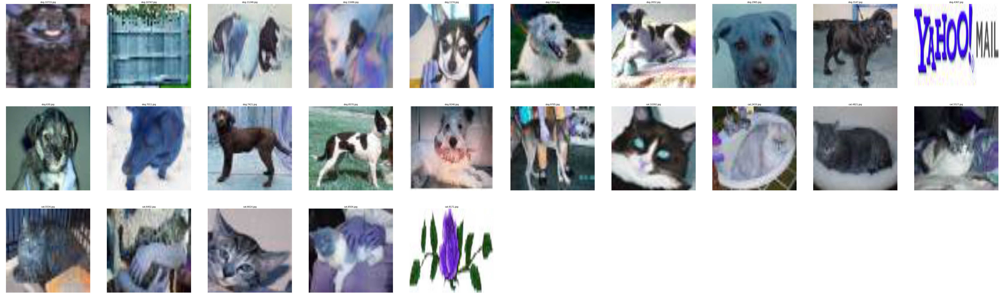

In [7]:
show_pict_set(tiny_pict,3,10)

In [27]:
print(len(model_pred_err))
print(model_pred_err)

46
['cat.10029.jpg', 'cat.10037.jpg', 'cat.10270.jpg', 'cat.10700.jpg', 'cat.10712.jpg', 'cat.11184.jpg', 'cat.12227.jpg', 'cat.12272.jpg', 'cat.12378.jpg', 'cat.2150.jpg', 'cat.2520.jpg', 'cat.2663.jpg', 'cat.3216.jpg', 'cat.372.jpg', 'cat.4308.jpg', 'cat.4338.jpg', 'cat.4688.jpg', 'cat.5351.jpg', 'cat.5418.jpg', 'cat.5820.jpg', 'cat.6345.jpg', 'cat.6402.jpg', 'cat.6442.jpg', 'cat.6655.jpg', 'cat.6699.jpg', 'cat.7372.jpg', 'cat.7377.jpg', 'cat.7487.jpg', 'cat.7564.jpg', 'cat.7920.jpg', 'cat.7968.jpg', 'cat.8456.jpg', 'cat.8470.jpg', 'cat.9110.jpg', 'cat.9171.jpg', 'cat.9596.jpg', 'dog.10161.jpg', 'dog.10237.jpg', 'dog.10801.jpg', 'dog.12376.jpg', 'dog.1773.jpg', 'dog.2422.jpg', 'dog.2614.jpg', 'dog.5604.jpg', 'dog.8736.jpg', 'dog.9517.jpg']


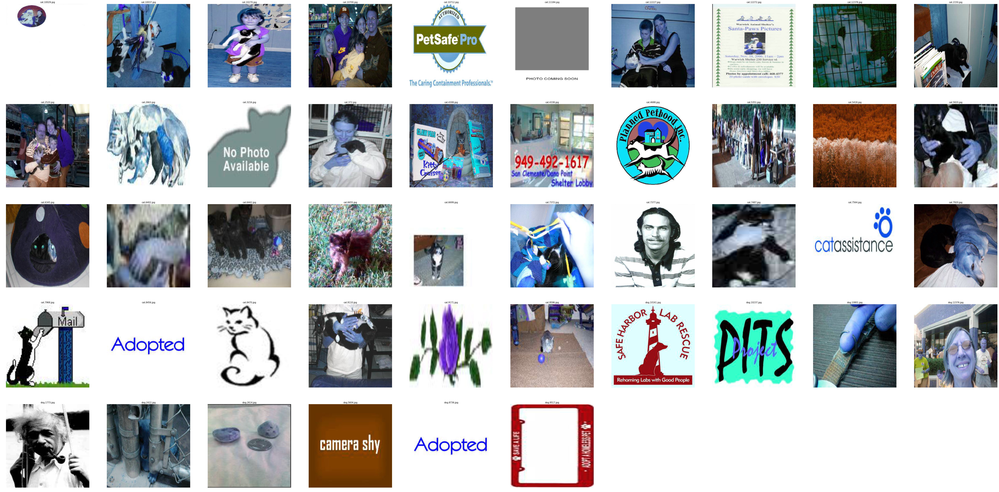

In [9]:
show_pict_set(model_pred_err,5,10)

### 移除异常值
通过仔细识别图片，确定哪些图片属于异常值，然后从预训练数据集中移除异常值

In [16]:
tiny_outline=['dog.10747.jpg','dog.4367.jpg','cat.9171.jpg']
model_outline=['cat.3216.jpg','cat.4338.jpg','cat.5351.jpg','cat.5418.jpg','cat.7377.jpg','cat.7564.jpg',
               'cat.8456.jpg','cat.9171.jpg','cat.10029.jpg','cat.10712.jpg','cat.11184.jpg','dog.1773.jpg',
               'dog.2614.jpg','dog.5604.jpg','dog.8736.jpg','dog.9517.jpg','dog.10237.jpg','dog.10801.jpg','dog.12376.jpg',
               'cat.2663.jpg','cat.4688.jpg','cat.7968.jpg','cat.8470.jpg','dog.10161.jpg']

outline=list(set(tiny_outline)|set(model_outline))

print(len(outline))

26


In [17]:
dogs=list(filter((lambda x:x not in outline),dogs))
cats=list(filter((lambda x:x not in outline),cats))
cat_lable=np.zeros(len(cats))
dog_lable=np.zeros(len(dogs))+1
print(len(dogs))
print(len(cats))

12489
12485


### 划分验证集

In [18]:
from sklearn.model_selection import train_test_split
import numpy as np

dogs_train,dogs_valid,dog_lable_train,dog_lable_valid=train_test_split(dogs,dog_lable,test_size=0.2,random_state=10,shuffle=True)
cats_train,cats_valid,cat_lable_train,cat_lable_valid=train_test_split(cats,cat_lable,test_size=0.2,random_state=10,shuffle=True)

In [48]:
if os.path.exists('train2'):
    shutil.rmtree('train2')
    os.mkdir('train2')
    os.mkdir(r'train2/cat')
    os.mkdir(r'train2/dog')
else:
    os.mkdir('train2')
    os.mkdir(r'train2/cat')
    os.mkdir(r'train2/dog')

if os.path.exists('valid2'):
    shutil.rmtree('valid2')
    os.mkdir('valid2')
    os.mkdir(r'valid2/cat')
    os.mkdir(r'valid2/dog')
else:
    os.mkdir('valid2')
    os.mkdir(r'valid2/cat')
    os.mkdir(r'valid2/dog')
    
for file in dogs_valid:
    os.system('cp train/{} valid2/dog/'.format(file))
for file in cats_valid:
    os.system('cp train/{} valid2/cat/'.format(file))
    
for file in dogs_train:
    os.system('cp train/{} train2/dog/'.format(file))
for file in cats_train:
    os.system('cp train/{} train2/cat/'.format(file))

In [8]:
print(len(dogs_train))
print(len(cats_train))
print(len(dogs_valid))
print(len(cats_valid))
!ls train2/dog|wc -l
!ls train2/cat|wc -l
!ls valid2/dog|wc -l
!ls valid2/cat|wc -l

9991
9988
2498
2497
9991
9988
2498
2497


In [19]:
# for windows
#!tree
#for linux
!tree -d

print('\n')
print('statistics input dataset:')
print('total train pictures  :{}'.format(len(os.listdir('train'))))
print('total test  pictures  :{}'.format(len(os.listdir(r'test/test'))))
print('----------------------------------------')
print('totall outlines       :{}'.format(len(outline)))
print('')
print('train      set:  cats :{}'.format(len(os.listdir(r'train2/cat'))))
print('train      set:  dogs :{}'.format(len(os.listdir(r'train2/dog'))))
print('validation set:  cats :{}'.format(len(os.listdir(r'valid2/cat'))))
print('validation set:  dogs :{}'.format(len(os.listdir(r'valid2/dog'))))

.
├── test
│   └── test
├── train
├── train2
│   ├── cat
│   └── dog
└── valid2
    ├── cat
    └── dog

9 directories


statistics input dataset:
total train pictures  :25000
total test  pictures  :12500
----------------------------------------
totall outlines       :26

train      set:  cats :9988
train      set:  dogs :9991
validation set:  cats :2497
validation set:  dogs :2498


## 探索数据

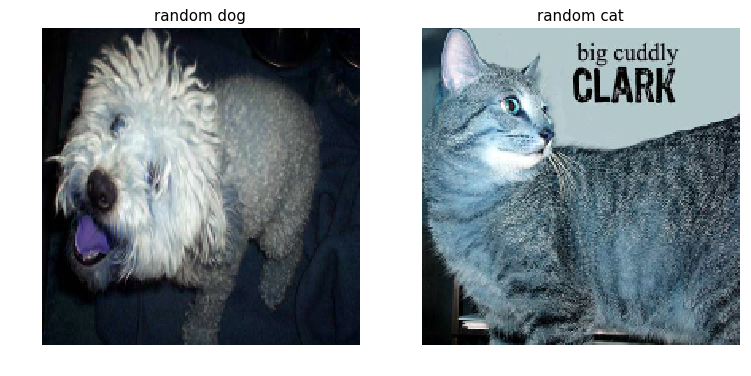

In [10]:
import os
import cv2
import random
import matplotlib.pyplot as plt

%matplotlib inline

dog_path=r'train/'+random.choice(dogs)
cat_path=r'train/'+random.choice(cats)

dog_pict=cv2.resize(cv2.imread(dog_path),(200,200))
cat_pict=cv2.resize(cv2.imread(cat_path),(200,200))

plt.figure(figsize=(10,5),dpi=90)
p1=plt.subplot(1,2,1)
p2=plt.subplot(1,2,2)
p1.set_title("random dog")
p2.set_title("random cat")
p1.imshow(dog_pict)
p2.imshow(cat_pict)
p1.axis('off')
p2.axis('off')
plt.show()

## 构建模型

定义可使用模型参数

In [36]:
import tensorflow as tf
from keras.models import *
from keras.layers import *
from keras.applications import *
from keras.preprocessing.image import *

import os
os.environ['PYTHONHASHSEED'] = '0'

model_ResNet50={'name':ResNet50,'shape':(224,224),'preprocess':None}
model_VGG16={'name':VGG16,'shape':(224,224),'preprocess':None}
model_VGG19={'name':VGG19,'shape':(224,224),'preprocess':None}
model_InceptionV3={'name':InceptionV3,'shape':(299,299),'preprocess':inception_v3.preprocess_input}
model_Xception={'name':Xception,'shape':(299,299),'preprocess':xception.preprocess_input}
model_InceptionResNetV2={'name':InceptionResNetV2,'shape':(299,299),'preprocess':inception_resnet_v2.preprocess_input}

In [37]:
#  define input tensor
def input_define(mask):
    input_tensor=[]
    if mask[0]==1:
        input_tensor.append(Input(shape=(299, 299, 3)))
    if mask[1]==1:
        input_tensor.append(Input(shape=(224, 224, 3)))
    return input_tensor

#  define ImageDataGenerator
def img_load_mask_transfer(input_type,mask,batch_size,enhance=False):
    masked_load=[]
    
    # enhance parameter for train
    if enhance:
        if input_type=='train':
            data_gen_args = dict(rotation_range=90.,
                                 width_shift_range=0.1,
                                 height_shift_range=0.1,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 zoom_range=0.2)
    else:
        data_gen_args = dict()

    #   directories  from different input        
    if (input_type=='train'):
        load_direct=r'train2'
    elif (input_type=='valid'):
        load_direct=r'valid2'

    #   mask  ImageDataGenerator   
    if mask[0]==1:
        image_size=(299,299)
        gen1 = ImageDataGenerator(**data_gen_args)
        image_gen1=gen1.flow_from_directory(directory=load_direct,class_mode='binary',
                                            target_size=(299, 299),batch_size=batch_size,
                                            follow_links=True,seed=1)
        masked_load.append(image_gen1)
    if mask[1]==1:
        image_size=(224,224)
        gen2 = ImageDataGenerator(**data_gen_args)
        image_gen2 = gen2.flow_from_directory(directory=load_direct,class_mode='binary',
                                              target_size=(224,224),batch_size=batch_size,
                                              follow_links=True,seed=1)
        masked_load.append(image_gen2)
    # if not use append  then use zip
    if sum(mask)>1:
        return(masked_load)
    else:
        return masked_load[0]

In [38]:
#  define base model
def import_model(model_input,model_dict):
    if model_dict['preprocess']:
        x = Lambda(model_dict['preprocess'])(model_input)
    else:
        x=model_input
        
    base_model=model_dict['name'](input_tensor=x,weights='imagenet',include_top=False)
    for layers in base_model.layers:
        layers.trainable = False
    return base_model

# define concatenate model
def model_concatenate(input_set,model_set):
    if (len(input_set)>1):
        input1=input_set[0]
        input2=input_set[1]
    else:
        input1=input_set[0]
        input2=input_set[0]

    mid_out=[]
    
    for i in range(len(model_set)):
        if model_set[i] in [model_Xception,model_InceptionV3]:
            base_model=import_model(input1,model_set[i])
        else:
            base_model=import_model(input2,model_set[i])
    
        pool_layer=GlobalAveragePooling2D()(base_model.output)
        mid_out.append(pool_layer)
    
    #print(mid_out)
    
    if (len(model_set)>1):
        x= Concatenate(axis=-1)(mid_out)
    else:
        x=mid_out[0]
    
    x = Dropout(0.5)(x)
    out=Dense(1,activation='sigmoid')(x)
    #print(out)

    return out

#### 初始模型
初始模型选用了InceptionV3，Xception两种模型的融合

In [55]:
model_set=[model_InceptionV3,model_Xception]

##   model_mask   used for mask input(train,valid,test)
model_mask=[0,0]
for i in range(len(model_set)):
    if model_set[i] in [model_Xception,model_InceptionV3]:
        model_mask[0]=1
    else:
        model_mask[1]=1

print('model input mask:{}'.format(model_mask))

model input mask:[1, 0]


In [56]:
# model input  depends on model select 
# [tensor(299, 299),tensor(224, 224)]  or tensor(299, 299)  or tensor(224, 224)
input_set=input_define(model_mask)

out=model_concatenate(input_set,model_set)

model = Model(input_set, out)

model.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['accuracy'])

In [63]:
batch_size=128
nb_epochs=10
steps_per_epoch =np.ceil((len(dogs_train)+len(cats_train))/batch_size)
validation_steps=np.ceil((len(dogs_valid)+len(cats_valid))/batch_size)

In [42]:
train_load=img_load_mask_transfer('train',model_mask,batch_size=batch_size,enhance=True)

valid_load=img_load_mask_transfer('valid',model_mask,batch_size=batch_size)

Found 19979 images belonging to 2 classes.
Found 4995 images belonging to 2 classes.


In [60]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2)

hist = model.fit_generator(train_load, 
                           epochs=nb_epochs,
                           steps_per_epoch=steps_per_epoch,
                           validation_data=valid_load,
                           validation_steps=validation_steps,
                           callbacks=[early_stopping])


Epoch 1/10
157/157 [==============================] - 470s 3s/step - loss: 0.3166 - acc: 0.8655 - val_loss: 0.1458 - val_acc: 0.9493
Epoch 2/10
157/157 [==============================] - 438s 3s/step - loss: 0.1963 - acc: 0.9252 - val_loss: 0.0980 - val_acc: 0.9674
Epoch 3/10
157/157 [==============================] - 437s 3s/step - loss: 0.1718 - acc: 0.9307 - val_loss: 0.0596 - val_acc: 0.9826
Epoch 4/10
157/157 [==============================] - 440s 3s/step - loss: 0.1633 - acc: 0.9347 - val_loss: 0.0601 - val_acc: 0.9818
Epoch 5/10
157/157 [==============================] - 439s 3s/step - loss: 0.1566 - acc: 0.9358 - val_loss: 0.0449 - val_acc: 0.9868
Epoch 6/10
157/157 [==============================] - 441s 3s/step - loss: 0.1545 - acc: 0.9366 - val_loss: 0.0701 - val_acc: 0.9788
Epoch 7/10
157/157 [==============================] - 436s 3s/step - loss: 0.1512 - acc: 0.9395 - val_loss: 0.0582 - val_acc: 0.9822


In [62]:
print(hist.history)

{'val_loss': [0.1458266831375099, 0.09799152335769183, 0.05962980295362714, 0.060072626462868144, 0.04486299671262532, 0.07009973532191148, 0.05816879744741234], 'acc': [0.8673607287741536, 0.9253215876819673, 0.9308273687520908, 0.9348315731667263, 0.9365333600250461, 0.9361829921417488, 0.9396866710194716], 'loss': [0.31471456619012855, 0.19516739109011286, 0.17190281218314493, 0.1632330223035631, 0.15634085459121802, 0.1550766479680235, 0.1503595144110009], 'val_acc': [0.9493493493493493, 0.9673673673673674, 0.9825825825825826, 0.9817817817817818, 0.9867867867867868, 0.9787787787787787, 0.9821821821821822]}


In [66]:
model.save('base-model.h5')

#### 展示模型结构

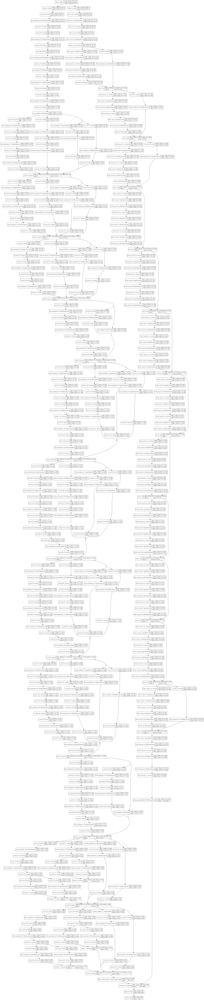

In [24]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model

plot_model(model, to_file='model.png')
SVG(model_to_dot(model,show_shapes=True).create(prog='dot', format='svg'))

In [2]:
list(zip([x.name for x in model.layers], range(len(model.layers))))

[('input_6', 0),
 ('lambda_7', 1),
 ('conv2d_498', 2),
 ('batch_normalization_498', 3),
 ('activation_535', 4),
 ('conv2d_499', 5),
 ('batch_normalization_499', 6),
 ('activation_536', 7),
 ('conv2d_500', 8),
 ('batch_normalization_500', 9),
 ('activation_537', 10),
 ('max_pooling2d_18', 11),
 ('conv2d_501', 12),
 ('batch_normalization_501', 13),
 ('activation_538', 14),
 ('conv2d_502', 15),
 ('batch_normalization_502', 16),
 ('activation_539', 17),
 ('max_pooling2d_19', 18),
 ('conv2d_506', 19),
 ('batch_normalization_506', 20),
 ('activation_543', 21),
 ('conv2d_504', 22),
 ('conv2d_507', 23),
 ('batch_normalization_504', 24),
 ('batch_normalization_507', 25),
 ('activation_541', 26),
 ('activation_544', 27),
 ('average_pooling2d_29', 28),
 ('conv2d_503', 29),
 ('conv2d_505', 30),
 ('conv2d_508', 31),
 ('conv2d_509', 32),
 ('batch_normalization_503', 33),
 ('batch_normalization_505', 34),
 ('batch_normalization_508', 35),
 ('batch_normalization_509', 36),
 ('activation_540', 37),
 ('

#### 模型优化
解除模型400层之后参数锁定，加入可训练网络层

In [39]:
model_set=[model_InceptionV3,model_Xception]

##   model_mask   used for mask input(train,valid,test)
model_mask=[0,0]
for i in range(len(model_set)):
    if model_set[i] in [model_Xception,model_InceptionV3]:
        model_mask[0]=1
    else:
        model_mask[1]=1

input_set=input_define(model_mask)
out=model_concatenate(input_set,model_set)
model = Model(input_set, out)

for layer in model.layers[400:]:
    layer.trainable = True
    
model.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['accuracy'])        
        
batch_size=128
nb_epochs=10
steps_per_epoch =np.ceil((len(dogs_train)+len(cats_train))/batch_size)
validation_steps=np.ceil((len(dogs_valid)+len(cats_valid))/batch_size)

In [43]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=2)
hist1 = model.fit_generator(train_load, 
                           epochs=nb_epochs,
                           steps_per_epoch=steps_per_epoch,
                           validation_data=valid_load,
                           validation_steps=validation_steps,
                           callbacks=[early_stopping])

Epoch 1/10
157/157 [==============================] - 946s 6s/step - loss: 0.1276 - acc: 0.9458 - val_loss: 0.0621 - val_acc: 0.9842
Epoch 2/10
157/157 [==============================] - 832s 5s/step - loss: 0.0792 - acc: 0.9694 - val_loss: 0.0403 - val_acc: 0.9884
Epoch 3/10
157/157 [==============================] - 832s 5s/step - loss: 0.0657 - acc: 0.9727 - val_loss: 0.0414 - val_acc: 0.9874
Epoch 4/10
157/157 [==============================] - 832s 5s/step - loss: 0.0583 - acc: 0.9773 - val_loss: 0.0246 - val_acc: 0.9922
Epoch 5/10
157/157 [==============================] - 831s 5s/step - loss: 0.0516 - acc: 0.9802 - val_loss: 0.0224 - val_acc: 0.9924
Epoch 6/10
157/157 [==============================] - 832s 5s/step - loss: 0.0442 - acc: 0.9839 - val_loss: 0.0456 - val_acc: 0.9870
Epoch 7/10
157/157 [==============================] - 831s 5s/step - loss: 0.0454 - acc: 0.9830 - val_loss: 0.0169 - val_acc: 0.9946
Epoch 8/10
157/157 [==============================] - 832s 5s/step - 

In [44]:
print(hist1.history)

{'val_acc': [0.9841841841841842, 0.9883883883883884, 0.9873873873873874, 0.9921921921921922, 0.9923923923923924, 0.986986986986987, 0.9945945945945946, 0.9907907907907908, 0.9953953953953953], 'acc': [0.9496971820456183, 0.970268782218349, 0.973071725326494, 0.9777266129585076, 0.9806296611591182, 0.9838330246759097, 0.9833825516941801, 0.986185494769508, 0.9882376495320087], 'val_loss': [0.06214478640221395, 0.0403114871809714, 0.04137574929750531, 0.024569918741561794, 0.022391762474052865, 0.045596841705189434, 0.016895256164452685, 0.03903047673051591, 0.018844278989307274], 'loss': [0.1229850282909646, 0.07748096970545469, 0.06557604121697355, 0.057143591206748834, 0.04970498229476495, 0.044307712657765244, 0.04411432918375024, 0.036802441971030185, 0.035719262424192065]}


In [72]:
model.save('tuning_model.h5')

## 模型结果可视化

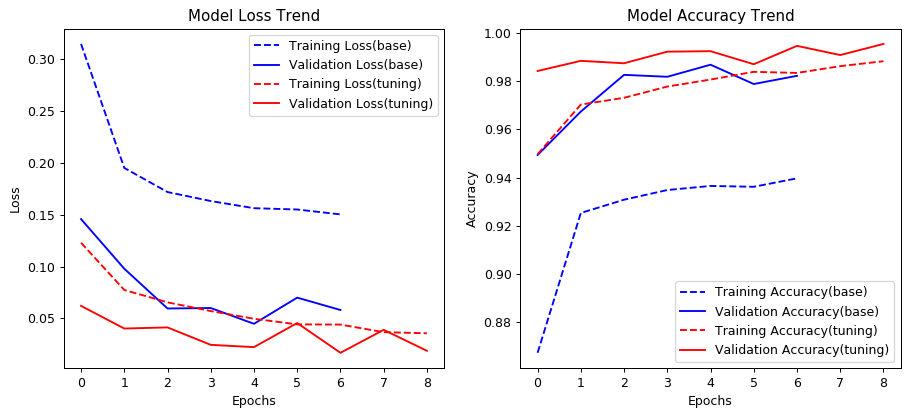

In [67]:
import numpy as np  
import matplotlib.pyplot as plt  

history=hist.history
history1=hist1.history
nb_epoach=max(len(history['val_loss']),len(history1['val_loss']))  

plt.figure(figsize=(12,5),dpi=90)
p1=plt.subplot(1,2,1)
p2=plt.subplot(1,2,2)

p1.set_xlabel('Epochs')  
p1.set_ylabel('Loss')  
p1.set_title('Model Loss Trend')  
p1.plot(history['loss'],'b--',label='Training Loss(base)')  
p1.plot(history['val_loss'],'blue',label='Validation Loss(base)')
p1.plot(history1['loss'],'r--',label='Training Loss(tuning)')  
p1.plot(history1['val_loss'],'red',label='Validation Loss(tuning)')
p1.set_xticks(range(0,nb_epoach))  
p1.legend()  
  
p2.set_xlabel('Epochs')  
p2.set_ylabel('Accuracy')
p2.set_title('Model Accuracy Trend')  
p2.plot(history['acc'],'b--',label='Training Accuracy(base)')  
p2.plot(history['val_acc'],'blue',label='Validation Accuracy(base)')
p2.plot(history1['acc'],'r--',label='Training Accuracy(tuning)')  
p2.plot(history1['val_acc'],'red',label='Validation Accuracy(tuning)')
p2.set_xticks(range(0,nb_epoach))
p2.legend()

plt.show()  

## 预测

In [1]:
import tensorflow as tf
from keras.models import *
from keras.layers import *
from keras.applications import *
from keras.preprocessing.image import *
from keras.applications import imagenet_utils
#model=load_model('tuning_model.h5')
model = load_model('tuning_model.h5', custom_objects={'imagenet_utils': imagenet_utils})

Using TensorFlow backend.


In [53]:
test_datagen = ImageDataGenerator()
test_load = test_datagen.flow_from_directory('test',
                                              class_mode=None,
                                              shuffle=False,
                                              target_size=(299, 299),
                                              batch_size=batch_size)

Found 12500 images belonging to 1 classes.


In [54]:
predict = model.predict_generator(test_load,verbose=1)
predict = predict.clip(min=0.005, max=0.995)

98/98 [==============================] - 437s 4s/step


In [57]:
print(len(predict))

12500


In [62]:
import pandas as pd
from keras.preprocessing.image import *

df = pd.read_csv("sample_submission.csv")

for i, fname in enumerate(test_load.filenames):
    name_seq=int(fname[fname.rfind('/')+1:fname.rfind('.')])
    index=list(df['id']).index(name_seq)
    df.iat[index,1]=predict[i]

df.to_csv('submission.csv', index=None)
df.head(10)

,id,label
0,1,0.995
1,2,0.995
2,3,0.995
3,4,0.995
4,5,0.005
5,6,0.005
6,7,0.005
7,8,0.005
8,9,0.005
9,10,0.005


#### 预测结果CAM可视化

In [12]:
import tensorflow as tf
from keras.models import *
from keras.layers import *
from keras.applications import *
from keras.preprocessing.image import *
from keras.applications import imagenet_utils
model = load_model('tuning_model.h5', custom_objects={'imagenet_utils': imagenet_utils})

In [13]:
weights = model.layers[448].get_weights()[0]
model2 = Model(model.input, [model.layers[442].output,model.layers[443].output,model.output])

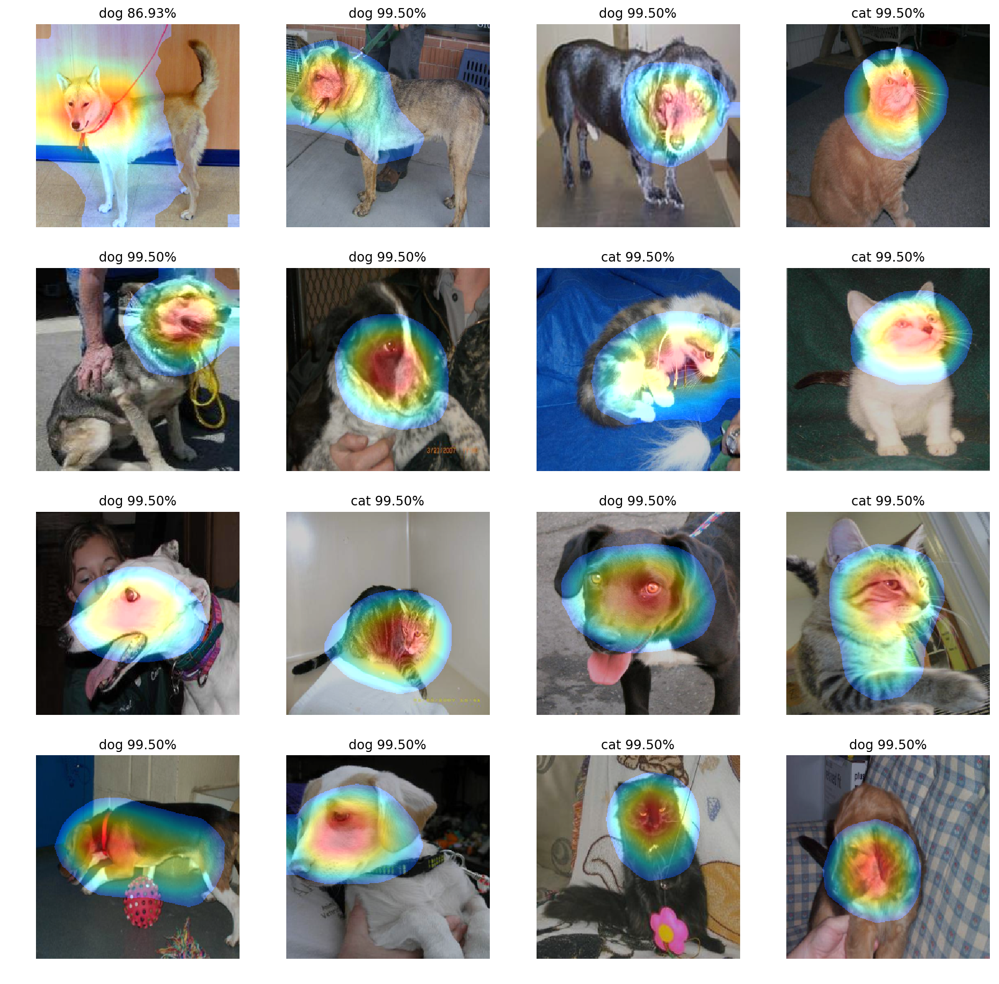

In [15]:
import matplotlib.pyplot as plt
import random
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

def heat_cam(img,prediction,layer_out_n,weights_n):
    cam = (prediction - 0.5) * np.matmul(layer_out_n, weights_n)
    cam -= cam.min()
    cam /= cam.max()
    cam -= 0.2
    cam /= 0.8
    cam = cv2.resize(cam, (299, 299))
    return cam
    
plt.figure(figsize=(16, 16))

cam_test=[]
for file in os.listdir(r'test/test/'):
    cam_test=np.append(cam_test,file)
    
for i in range(16):
    plt.subplot(4, 4, i+1)
    file=r'test/test/'+random.choice(cam_test)
    img=cv2.resize(cv2.imread(file),(299,299))
    x = img.copy()
    x.astype(np.float32)
    out1,out2,cam_pred = model2.predict(np.expand_dims(x, axis=0))

    cam_pred = cam_pred[0]
    cam_pred = cam_pred.clip(min=0.005, max=0.995)

    layer_out_1=out1[0]
    layer_out_2=out2[0]
    weights_1=weights[:2048]
    weights_2=weights[2048:]

    if cam_pred < 0.5:
        plt.title('cat %.2f%%' % (100 - cam_pred*100))
    else:
        plt.title('dog %.2f%%' % (cam_pred*100))

    cam_1=heat_cam(x,cam_pred,layer_out_1,weights_1)
    cam_2=heat_cam(x,cam_pred,layer_out_2,weights_2)
    cam=(cam_1+cam_2)/2.0
    
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap[np.where(cam <= 0.2)] = 0

    out = cv2.addWeighted(img, 0.8, heatmap, 0.4, 0)
        
    plt.axis('off')
    plt.imshow(out[:,:,::-1])